# NLP Pipeline — Phase 1
### OCR → tokens → stopwords → lemmas → named entities → key phrases
---

## Imports

In [135]:
!pip install --upgrade certifi


[notice] A new release of pip is available: 26.0.1 -> 26.1
[notice] To update, run: pip install --upgrade pip


In [136]:
import ssl
import certifi

ssl._create_default_https_context = lambda: ssl.create_default_context(cafile=certifi.where())



In [137]:
# ── Image / OCR ───────────────────────────────────────────────────────────
# Reference: pytesseract — https://github.com/madmaze/pytesseract
import cv2
import pytesseract

# ── Core NLP ──────────────────────────────────────────────────────────────
# Reference: spaCy / en_core_web_sm — https://spacy.io/models/en
import spacy
from spacy import displacy
from IPython.display import display, HTML

# ── NLTK ──────────────────────────────────────────────────────────────────
# Reference: NLTK — https://www.nltk.org/
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
nltk.download('stopwords',  quiet=True)
nltk.download('punkt_tab',  quiet=True)
nltk.download('wordnet',    quiet=True)

# ── Utilities ─────────────────────────────────────────────────────────────
import matplotlib.pyplot as plt

# Load spaCy model
nlp = spacy.load('en_core_web_sm')



[nltk_data] Error loading stopwords: <urlopen error [SSL:
[nltk_data]     CERTIFICATE_VERIFY_FAILED] certificate verify failed:
[nltk_data]     unable to get local issuer certificate (_ssl.c:1000)>
[nltk_data] Error loading punkt_tab: <urlopen error [SSL:
[nltk_data]     CERTIFICATE_VERIFY_FAILED] certificate verify failed:
[nltk_data]     unable to get local issuer certificate (_ssl.c:1000)>
[nltk_data] Error loading wordnet: <urlopen error [SSL:
[nltk_data]     CERTIFICATE_VERIFY_FAILED] certificate verify failed:
[nltk_data]     unable to get local issuer certificate (_ssl.c:1000)>


---
## Source Document — PDF or image file.

Set `SOURCE_FILE` to your input (`.pdf`, `.jpg`, `.png`, etc.). The loader renders PDFs to a PNG automatically; all downstream cells read from `ocr_text`.

In [138]:
# -- Source loader --------------------------------------------------------
# Set SOURCE_FILE to your file. PAGE_NUM and DPI are only used for PDFs.
#
# Supported:
#   .pdf             -> page rendered to PNG via pypdfium2 (fallback: PyMuPDF)
#   .jpg .jpeg .png .bmp .tiff .tif  -> image used directly
#
# References:
#   pypdfium2  -- https://pypdfium2.readthedocs.io/en/stable/
#   PyMuPDF    -- https://pymupdf.readthedocs.io/en/latest/

import os, sys, subprocess

SOURCE_FILE  = 'Eventos-deportivos-EN.pdf'   # <-- add image or pdf file here 
PAGE_NUM     = 4             # 0-based page number. User manually selects the page of interest (PDF only)
DPI          = 200  #Controls resolution when coverting

RENDERED_PNG = None
PDF_FILE     = None

_ext        = os.path.splitext(SOURCE_FILE)[1].lower()
_IMAGE_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.tif'}


#Error handling

if not os.path.exists(SOURCE_FILE):
    raise FileNotFoundError(
        f"Could not find '{SOURCE_FILE}'. "
        "Make sure the file is in the same directory as this notebook."
    )

if _ext == '.pdf':
    PDF_FILE     = SOURCE_FILE
    RENDERED_PNG = 'paper_p1.png'
    _render_lib  = None
    try:
        import pypdfium2 as _pdfium
        _render_lib = 'pypdfium2'
    except ImportError:
        try:
            import fitz as _fitz
            _render_lib = 'fitz'
        except ImportError:
            print('No PDF library found; installing pypdfium2...')
            subprocess.check_call([sys.executable, '-m', 'pip', 'install', '--quiet', 'pypdfium2'])
            import pypdfium2 as _pdfium
            _render_lib = 'pypdfium2'

    if _render_lib == 'pypdfium2':
        _pdf = _pdfium.PdfDocument(PDF_FILE)
        _img_pil = _pdf[PAGE_NUM].render(scale=DPI / 72).to_pil()
        _img_pil.save(RENDERED_PNG)
        _w, _h = _img_pil.width, _img_pil.height
        _pdf.close()
    else:
        _doc = _fitz.open(PDF_FILE)
        _pix = _doc[PAGE_NUM].get_pixmap(
            matrix=_fitz.Matrix(DPI / 72, DPI / 72), alpha=False
        )
        _pix.save(RENDERED_PNG)
        _w, _h = _pix.width, _pix.height  #stored image dimensions
        _doc.close()

    print(f'PDF  : rendered page {PAGE_NUM + 1} of "{SOURCE_FILE}"  ({_render_lib})')
    print(f'    -> {RENDERED_PNG}  ({_w} x {_h} px @ {DPI} DPI)')

elif _ext in _IMAGE_EXTS:
    RENDERED_PNG = SOURCE_FILE
    print(f'Image: "{SOURCE_FILE}" will be used directly as input.')

else:
    raise ValueError(
        f"Unsupported file type '{_ext}'. "
        "Supported formats: .pdf  .jpg  .jpeg  .png  .bmp  .tiff  .tif"
    )


PDF  : rendered page 5 of "Eventos-deportivos-EN.pdf"  (pypdfium2)
    -> paper_p1.png  (1654 x 2339 px @ 200 DPI)


---
## Image Input & OCR — Tesseract reads pixel data and converts it to a raw text string. 

Image loaded: paper_p1.png
Shape (height, width, channels): (2339, 1654, 3)


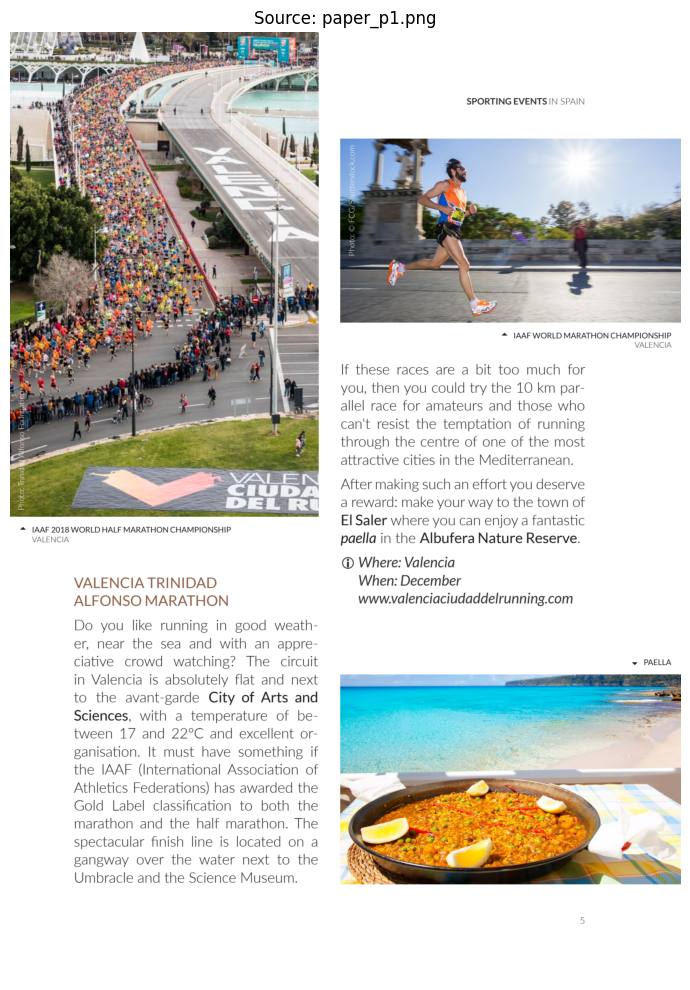

In [139]:
# -- Load and display source image -----------------------------------------
# cv2.imread / cv2.cvtColor pattern: WK6 Lab Code.

IMAGE_FILE = RENDERED_PNG
img = cv2.imread(IMAGE_FILE)

if img is None:
    raise FileNotFoundError(
        f"Could not load '{IMAGE_FILE}'. "
        "Make sure the file is in the same directory as this notebook."
    )

print(f'Image loaded: {IMAGE_FILE}')
print(f'Shape (height, width, channels): {img.shape}')

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(8, 10))
plt.imshow(img_rgb)
plt.axis('off')
plt.title(f'Source: {IMAGE_FILE}', fontsize=12)
plt.tight_layout()
plt.show()


In [140]:
# -- OCR with Tesseract ----------------------------------------------------
# Reference: pytesseract image_to_string — https://github.com/madmaze/pytesseract
# --oem 1  = LSTM neural network engine (Tesseract 5)
# --psm 6  = assume a uniform block of text

custom_config = r'--oem 1 --psm 6'
ocr_text = pytesseract.image_to_string(img, config=custom_config)
print('=== RAW OCR OUTPUT ===')
print(ocr_text)


=== RAW OCR OUTPUT ===
SP . J dhe Ve fe wees Ser
oan ‘t ca . Me of ie a SPORTING EVENTS IN SPAIN
Bo, aS : SL) as et ? ot 4 f —\ | VAAF WORLD MARATHON CHAMPIONSHIP
qo yn oer: ee : If these races are a bit too much for
aN ai 1 ite you, then you could try the 10 km par-
2 eel EDP he | 5 ome sais Ae-— allel race for amateurs and those who
fe) — Po ae : can't resist the temptation of running
a sm ol a through the centre of one of the most
a : a attractive cities in the Mediterranean.
a = SS ci Dz After making such an effort you deserve
Fa  . ——- DELR | a reward: make your way to the town of
El Saler where you can enjoy a fantastic
@ IAAF 2018 WORLD HALF MARATHON CHAMPIONSHIP .
VALENCIA paella in the Albufera Nature Reserve.
@® Where: Valencia
VALENCIA TRINIDAD When: December
ALFONSO MARATHON www.valenciaciudaddelrunning.com
Do you like running in good weath-
er, near the sea and with an appre-
ciative crowd watching? The circuit ~ PAELLA
in Valencia is absolutely flat and next : oa Bese
to 

---
## 1. Tokenisation — splits raw text into individual word tokens. First step in making text machine-readable.
### 1a. NLTK Tokenisation — rule-based word splitting using the punkt tokeniser.

In [141]:
# ── Tokenise the OCR text using NLTK word_tokenize ────────────────────────
# WK2 Lab Code.
text_tokens = word_tokenize(ocr_text)

print('=== NLTK TOKENS ===')
print(text_tokens)
print(f'\nTotal tokens: {len(text_tokens)}')

=== NLTK TOKENS ===
['SP', '.', 'J', 'dhe', 'Ve', 'fe', 'wees', 'Ser', 'oan', '‘', 't', 'ca', '.', 'Me', 'of', 'ie', 'a', 'SPORTING', 'EVENTS', 'IN', 'SPAIN', 'Bo', ',', 'aS', ':', 'SL', ')', 'as', 'et', '?', 'ot', '4', 'f', '—', '\\', '|', 'VAAF', 'WORLD', 'MARATHON', 'CHAMPIONSHIP', 'qo', 'yn', 'oer', ':', 'ee', ':', 'If', 'these', 'races', 'are', 'a', 'bit', 'too', 'much', 'for', 'aN', 'ai', '1', 'ite', 'you', ',', 'then', 'you', 'could', 'try', 'the', '10', 'km', 'par-', '2', 'eel', 'EDP', 'he', '|', '5', 'ome', 'sais', 'Ae-', '—', 'allel', 'race', 'for', 'amateurs', 'and', 'those', 'who', 'fe', ')', '—', 'Po', 'ae', ':', 'ca', "n't", 'resist', 'the', 'temptation', 'of', 'running', 'a', 'sm', 'ol', 'a', 'through', 'the', 'centre', 'of', 'one', 'of', 'the', 'most', 'a', ':', 'a', 'attractive', 'cities', 'in', 'the', 'Mediterranean', '.', 'a', '=', 'SS', 'ci', 'Dz', 'After', 'making', 'such', 'an', 'effort', 'you', 'deserve', 'Fa', '.', '—', '—', '-', 'DELR', '|', 'a', 'reward', ':',

### 1b. spaCy Tokenisation — linguistically-aware splitting that handles contractions, punctuation, and special characters.

In [142]:
# ── Tokenise with spaCy ───────────────────────────────────────────────────
# WK2 Lab Code.
doc = nlp(ocr_text)

print('=== spaCy TOKENS ===')
for token in doc:
    print(token.text, token.pos_, end=' | ')

print(f'\n\nTotal tokens: {len(doc)}')
print(f'Vocabulary size (en_core_web_sm): {len(doc.vocab)}')

=== spaCy TOKENS ===
SP INTJ | . PUNCT | J PROPN | dhe PROPN | Ve PROPN | fe PROPN | wees PROPN | Ser PROPN | 
 SPACE | oan NOUN | ‘ PUNCT | t NOUN | ca NOUN | . PUNCT | Me PRON | of ADP | ie ADV | a DET | SPORTING NOUN | EVENTS NOUN | IN ADP | SPAIN PROPN | 
 SPACE | Bo PROPN | , PUNCT | aS ADP | : PUNCT | SL PROPN | ) PUNCT | as ADP | et NOUN | ? PUNCT | ot NOUN | 4 NUM | f PROPN | — PUNCT | \ PROPN | | NOUN | VAAF PROPN | WORLD PROPN | MARATHON PROPN | CHAMPIONSHIP PROPN | 
 SPACE | qo X | yn PROPN | oer PROPN | : PUNCT | ee ADP | : PUNCT | If SCONJ | these DET | races NOUN | are AUX | a DET | bit NOUN | too ADV | much ADV | for ADP | 
 SPACE | aN PRON | ai NOUN | 1 NUM | ite ADP | you PRON | , PUNCT | then ADV | you PRON | could AUX | try VERB | the DET | 10 NUM | km NOUN | par- PROPN | 
 SPACE | 2 NUM | eel NOUN | EDP PROPN | he PRON | | PROPN | 5 NUM | ome NOUN | sais PROPN | Ae- PROPN | — PUNCT | allel NOUN | race NOUN | for ADP | amateurs NOUN | and CCONJ | those PRON | who PRO

---
## 2. Stopword Removal — filters out high-frequency words like "the" and "and" that carry no meaning.
### 2a. Negation-Aware Stopword Removal — keeps "not" to preserve sentence polarity.

In [143]:
# ── Negation-aware stopword removal — keep 'not' to preserve meaning ─────
# WK2 Lab Code.
# Removing 'not' from the stoplist prevents downstream models treating
# "not good" and "good" identically — a common preprocessing mistake.

sw_no_not = stopwords.words('english')
sw_no_not.remove('not')

# ── Demonstration: same sentence, two stopword lists ─────────────────────
_demo = "The model is not accurate and the results are not reliable"
_drop = [w for w in word_tokenize(_demo) if w not in stopwords.words('english')]
_keep = [w for w in word_tokenize(_demo) if w not in sw_no_not]
print('=== Negation Awareness Demo ===')
print(f'Original  : {_demo}')
print(f'Drop "not": {_drop}')
print(f'Keep "not": {_keep}')
print('\n-> Without "not", "not accurate" becomes indistinguishable from "accurate".')
print('   Keeping it preserves negative polarity for VADER and downstream classifiers.\n')

# ── Apply to OCR text ─────────────────────────────────────────────────────
tokens_without_sw = [w for w in text_tokens if w not in sw_no_not]
print(f'OCR token count (negation-aware) : {len(tokens_without_sw)} / {len(text_tokens)}')


=== Negation Awareness Demo ===
Original  : The model is not accurate and the results are not reliable
Drop "not": ['The', 'model', 'accurate', 'results', 'reliable']
Keep "not": ['The', 'model', 'not', 'accurate', 'results', 'not', 'reliable']

-> Without "not", "not accurate" becomes indistinguishable from "accurate".
   Keeping it preserves negative polarity for VADER and downstream classifiers.

OCR token count (negation-aware) : 240 / 333


### 2e. spaCy Stopword Removal — applying the filter to the full OCR text using the spaCy vocabulary.

In [144]:
# ── Apply spaCy stopword removal to OCR text ──────────────────────────────
# WK2 Lab Code.
doc = nlp(ocr_text)

filtered_tokens = [
    token.text
    for token in doc
    if not token.is_stop
    and not token.is_punct
    and not token.is_space
]
clean_text = ' '.join(filtered_tokens)

print('=== CLEANED TEXT (spaCy — stopwords + punctuation removed) ===')
print(clean_text)

total_count    = len([t for t in doc if not t.is_punct and not t.is_space])
filtered_count = len(filtered_tokens)
stopword_count = total_count - filtered_count

print(f'\nTotal tokens (with stopwords) : {total_count}')
print(f'Tokens (without stopwords)    : {filtered_count}')
print(f'Stopwords removed             : {stopword_count}')

=== CLEANED TEXT (spaCy — stopwords + punctuation removed) ===
SP J dhe Ve fe wees Ser oan t ie SPORTING EVENTS SPAIN Bo SL et ot 4 f | VAAF WORLD MARATHON CHAMPIONSHIP qo yn oer ee races bit ai 1 ite try 10 km par- 2 eel EDP | 5 ome sais Ae- allel race amateurs fe Po ae resist temptation running sm ol centre attractive cities Mediterranean = SS ci Dz making effort deserve Fa DELR | reward way town El Saler enjoy fantastic IAAF 2018 WORLD HALF MARATHON CHAMPIONSHIP VALENCIA paella Albufera Nature Reserve ® Valencia VALENCIA TRINIDAD December ALFONSO MARATHON www.valenciaciudaddelrunning.com like running good weath- er near sea appre- ciative crowd watching circuit ~ PAELLA Valencia absolutely flat oa Bese avant garde City Arts Sciences temperature be- tween 17 22 ° C excellent or- ee ganisation IAAF International Association | Athletics Federations awarded spite SS Gold Label classification > PRIOR Sea marathon half marathon Biv pe spectacular finish line located Se EAS t v7 gangway wa

---
## 3. Lemmatisation — reduces words to their base form: "running" → "run", "studies" → "study".
### 3a. spaCy Lemmatisation — context-aware, using part-of-speech to distinguish "meeting" the noun from "meeting" the verb.

In [145]:
# ── Lemmatise using spaCy ─────────────────────────────────────────────────
# WK2 Lab Code.
doc = nlp(ocr_text)

lemmatised = [
    token.lemma_.lower()
    for token in doc
    if not token.is_stop
    and not token.is_punct
    and not token.is_space
]

print('=== LEMMATISED TOKENS ===')
print(' | '.join(lemmatised))

=== LEMMATISED TOKENS ===
sp | j | dhe | ve | fe | wees | ser | oan | t | ie | sporting | event | spain | bo | sl | et | ot | 4 | f | | | vaaf | world | marathon | championship | qo | yn | oer | ee | race | bit | ai | 1 | ite | try | 10 | km | par- | 2 | eel | edp | | | 5 | ome | sais | ae- | allel | race | amateur | fe | po | ae | resist | temptation | run | sm | ol | centre | attractive | city | mediterranean | = | ss | ci | dz | make | effort | deserve | fa | delr | | | reward | way | town | el | saler | enjoy | fantastic | iaaf | 2018 | world | half | marathon | championship | valencia | paella | albufera | nature | reserve | ® | valencia | valencia | trinidad | december | alfonso | marathon | www.valenciaciudaddelrunning.com | like | run | good | weath- | er | near | sea | appre- | ciative | crowd | watch | circuit | ~ | paella | valencia | absolutely | flat | oa | bese | avant | garde | city | arts | sciences | temperature | be- | tween | 17 | 22 | ° | c | excellent | or- | ee | 

---
## 4. Named Entity Recognition (NER) — identifies people, organisations, places, and dates in the text.
### 4a. Entity Extraction — spaCy labels text spans with their type: PERSON, ORG, GPE, DATE.

In [146]:
# ── NER on the OCR text from the pipeline ────────────────────────────────
# WK2 Lab Code.
# Reference: spaCy named entities — https://spacy.io/usage/linguistic-features#named-entities
doc_object = nlp(ocr_text)

# Basic entity print
print('=== ENTITIES ===')
for entity in doc_object.ents:
    print(entity)

print()

# Entity + label
print('=== ENTITY + LABEL ===')
for entity in doc_object.ents:
    print(entity, entity.label_)

print()

# Entity + label + description
print('=== ENTITY + LABEL + DESCRIPTION ===')
for entity in doc_object.ents:
    print(entity, entity.label_, spacy.explain(entity.label_))



=== ENTITIES ===
SPAIN
4 f —\
1
10 km par-
2
EDP
5
one
Mediterranean
El Saler
2018
VALENCIA
the Albufera Nature Reserve
Valencia
VALENCIA
December
ALFONSO MARATHON
PAELLA
Valencia
Bese
17
22
Athletics Federations
PRIOR Sea re &
Biv
Saka
Umbracle
the Science Museum
5

=== ENTITY + LABEL ===
SPAIN GPE
4 f —\ CARDINAL
1 CARDINAL
10 km par- QUANTITY
2 CARDINAL
EDP ORG
5 CARDINAL
one CARDINAL
Mediterranean LOC
El Saler ORG
2018 DATE
VALENCIA ORG
the Albufera Nature Reserve ORG
Valencia
VALENCIA PERSON
December DATE
ALFONSO MARATHON ORG
PAELLA ORG
Valencia GPE
Bese NORP
17 CARDINAL
22 DATE
Athletics Federations ORG
PRIOR Sea re & LOC
Biv PERSON
Saka PERSON
Umbracle PERSON
the Science Museum ORG
5 CARDINAL

=== ENTITY + LABEL + DESCRIPTION ===
SPAIN GPE Countries, cities, states
4 f —\ CARDINAL Numerals that do not fall under another type
1 CARDINAL Numerals that do not fall under another type
10 km par- QUANTITY Measurements, as of weight or distance
2 CARDINAL Numerals that do not fall unde

In [147]:
# ── show_entity_info helper function ─────────────────────────────────────
# WK2 Lab Code.
def show_entity_info(doc_object):
    """Print entity text, label and description in a table."""
    if doc_object.ents:
        header = f'{"Entity":<30} {"Label":<20} {"Description"}'
        print(header)
        print('-' * 70)
        for entity in doc_object.ents:
            print(f'{entity.text:<30} {entity.label_:<20} {spacy.explain(entity.label_)}')
    else:
        print('No entities found in text.')

# ── Apply to the OCR text ─────────────────────────────────────────────────
print('=== NER — OCR TEXT ===')
show_entity_info(nlp(ocr_text))

=== NER — OCR TEXT ===
Entity                         Label                Description
----------------------------------------------------------------------
SPAIN                          GPE                  Countries, cities, states
4 f —\                         CARDINAL             Numerals that do not fall under another type
1                              CARDINAL             Numerals that do not fall under another type
10 km par-                     QUANTITY             Measurements, as of weight or distance
2                              CARDINAL             Numerals that do not fall under another type
EDP                            ORG                  Companies, agencies, institutions, etc.
5                              CARDINAL             Numerals that do not fall under another type
one                            CARDINAL             Numerals that do not fall under another type
Mediterranean                  LOC                  Non-GPE locations, mountain ranges, bodies o

### 4b. displaCy Visualisation — renders entity labels as colour-coded HTML spans inline in the notebook.

In [148]:
# ── Render NER with displaCy ──────────────────────────────────────────────
# WK2 Lab Code.
# Reference: displaCy visualiser — https://spacy.io/usage/visualizers
doc_object = nlp(ocr_text)

html = displacy.render(doc_object, style='ent', jupyter=False)
display(HTML(html))

---
## 5. Key Phrases — noun chunks extracted as the most informative multi-word phrases in the text.


In [149]:
# ── Key phrases from the OCR document ────────────────────────────────────
# WK2 Lab Code.
# Reference: spaCy noun chunks — https://spacy.io/usage/linguistic-features#noun-chunks
# Reference: Luhn, H.P. (1958). The Automatic Creation of Literature Abstracts. IBM J. Res. Dev. 2(2). https://doi.org/10.1147/rd.22.0159
doc_ocr = nlp(ocr_text)

print(f'{"Phrase":<35} {"Root":<18} {"Dependency":<28} {"Head"}')
print('-' * 90)

for chunk in doc_ocr.noun_chunks:
    print(f'{chunk.text:<35} {chunk.root.text:<18} '
          f'{str(spacy.explain(chunk.root.dep_)):<28} {chunk.root.head.text}')

Phrase                              Root               Dependency                   Head
------------------------------------------------------------------------------------------
J dhe Ve fe wees Ser
oan            oan                root                         oan
‘t ca                               ca                 appositional modifier        oan
Me                                  Me                 root                         Me
a SPORTING EVENTS                   EVENTS             object of preposition        of
SPAIN
Bo                            Bo                 object of preposition        IN
SL                                  SL                 appositional modifier        aS
et                                  et                 object of preposition        as
ot 4 f —\ | VAAF WORLD MARATHON CHAMPIONSHIP
qo yn oer oer                root                         oer
these races                         races              nominal subject              are
aN            

---
## 6. Bag-of-Words — counts how often each word appears across sentences.

`CountVectorizer` splits the OCR text into sentence-level documents and builds a term-count matrix. Output includes a bar chart of the top 15 terms and a heat-map of the full matrix.

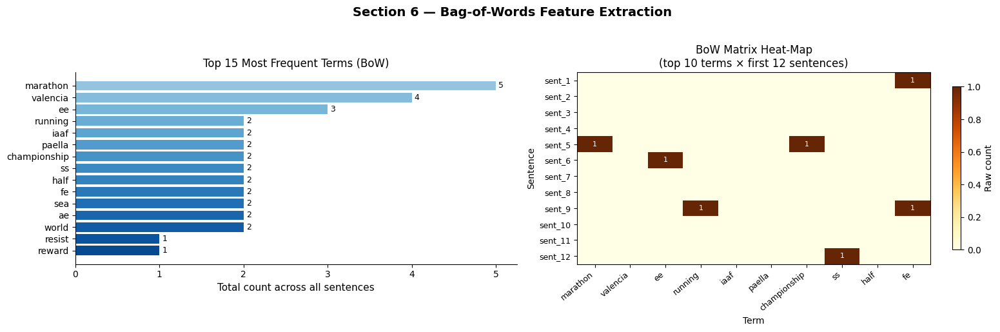

In [150]:
# ── Bag-of-Words on OCR text (computation + visualisation) ──────────────────
# Reference: scikit-learn CountVectorizer — https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd
import re
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np

# Split the OCR output into sentence-level "documents"
sentences = [s.strip() for s in re.split(r'[.!?\n]+', ocr_text) if len(s.strip()) > 4]

bow_vectoriser = CountVectorizer(stop_words='english', lowercase=True, min_df=1)
bow_matrix     = bow_vectoriser.fit_transform(sentences)

bow_df = pd.DataFrame(
    bow_matrix.toarray(),
    columns=bow_vectoriser.get_feature_names_out(),
    index=[f'sent_{i+1}' for i in range(len(sentences))]
)

totals = bow_df.sum(axis=0).sort_values(ascending=False)

TOP_N      = 15
top_terms  = totals.head(TOP_N)
top_labels = top_terms.index.tolist()

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle('Section 6 — Bag-of-Words Feature Extraction', fontsize=14, fontweight='bold', y=1.02)

# ── Left: horizontal bar chart of top-N terms ────────────────────────
ax = axes[0]
colours = plt.cm.Blues(np.linspace(0.4, 0.9, TOP_N))[::-1]
bars = ax.barh(top_labels[::-1], top_terms.values[::-1], color=colours)
ax.set_xlabel('Total count across all sentences', fontsize=11)
ax.set_title(f'Top {TOP_N} Most Frequent Terms (BoW)', fontsize=12)
ax.bar_label(bars, padding=3, fontsize=9)
ax.spines[['top', 'right']].set_visible(False)
ax.xaxis.set_major_locator(mticker.MaxNLocator(integer=True))

# ── Right: heat-map of the BoW matrix (top 10 terms x first 12 sentences) ──
ax2 = axes[1]
preview_cols = top_labels[:10]
hm_data = bow_df[preview_cols].head(12)
im = ax2.imshow(hm_data.values, aspect='auto', cmap='YlOrBr', interpolation='nearest')
ax2.set_xticks(range(len(preview_cols)))
ax2.set_xticklabels(preview_cols, rotation=40, ha='right', fontsize=9)
ax2.set_yticks(range(len(hm_data)))
ax2.set_yticklabels(hm_data.index, fontsize=9)
ax2.set_title('BoW Matrix Heat-Map\n(top 10 terms × first 12 sentences)', fontsize=12)
ax2.set_xlabel('Term', fontsize=10)
ax2.set_ylabel('Sentence', fontsize=10)
plt.colorbar(im, ax=ax2, label='Raw count', shrink=0.85)
for r in range(hm_data.shape[0]):
    for c in range(hm_data.shape[1]):
        v = hm_data.values[r, c]
        if v > 0:
            ax2.text(c, r, str(int(v)), ha='center', va='center', fontsize=8,
                     color='white' if v > hm_data.values.max() * 0.6 else 'black')

plt.tight_layout()
plt.show()


---
## 7. TF-IDF — down-weights common words, up-weights rare informative ones.

`TfidfVectorizer` (with `sublinear_tf=True`) scores each term by how distinctive it is across sentences. Results are shown alongside BoW scores for direct comparison.

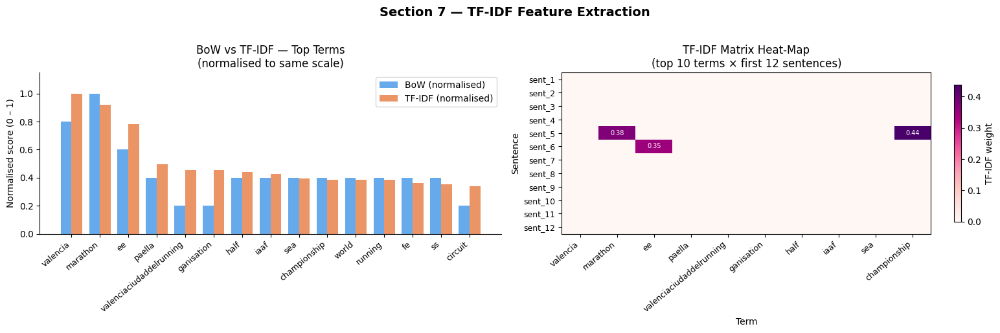

In [151]:
# ── TF-IDF on the same sentence-level corpus (computation + visualisation) ──
# Reference: scikit-learn TfidfVectorizer — https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
import matplotlib.pyplot as plt

tfidf_vectoriser = TfidfVectorizer(
    stop_words='english',
    lowercase=True,
    min_df=1,
    sublinear_tf=True
)
tfidf_matrix = tfidf_vectoriser.fit_transform(sentences)

tfidf_df = pd.DataFrame(
    tfidf_matrix.toarray(),
    columns=tfidf_vectoriser.get_feature_names_out(),
    index=[f'sent_{i+1}' for i in range(len(sentences))]
)

weights = tfidf_df.sum(axis=0).sort_values(ascending=False)

TOP_N      = 15
top_tfidf  = weights.head(TOP_N)
shared     = [t for t in top_tfidf.index if t in totals.index]
bow_vals   = totals[shared].values
bow_norm   = bow_vals / (bow_vals.max() + 1e-9)
tfidf_vals = top_tfidf[shared].values
tfidf_norm = tfidf_vals / (tfidf_vals.max() + 1e-9)

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle('Section 7 — TF-IDF Feature Extraction', fontsize=14, fontweight='bold', y=1.02)

# ── Left: BoW vs TF-IDF grouped bar (normalised) ────────────────────
ax = axes[0]
x  = np.arange(len(shared))
w  = 0.38
b1 = ax.bar(x - w/2, bow_norm,   width=w, label='BoW (normalised)',    color='#4c9be8', alpha=0.85)
b2 = ax.bar(x + w/2, tfidf_norm, width=w, label='TF-IDF (normalised)', color='#e8834c', alpha=0.85)
ax.set_xticks(x)
ax.set_xticklabels(shared, rotation=40, ha='right', fontsize=9)
ax.set_ylabel('Normalised score (0 – 1)', fontsize=10)
ax.set_title('BoW vs TF-IDF — Top Terms\n(normalised to same scale)', fontsize=12)
ax.legend(fontsize=10)
ax.spines[['top', 'right']].set_visible(False)
ax.set_ylim(0, 1.15)

# ── Right: TF-IDF heat-map across sentences ───────────────────────────
ax2 = axes[1]
hm_cols  = top_tfidf.index[:10].tolist()
hm_data2 = tfidf_df[hm_cols].head(12)
im2 = ax2.imshow(hm_data2.values, aspect='auto', cmap='RdPu', interpolation='nearest', vmin=0)
ax2.set_xticks(range(len(hm_cols)))
ax2.set_xticklabels(hm_cols, rotation=40, ha='right', fontsize=9)
ax2.set_yticks(range(len(hm_data2)))
ax2.set_yticklabels(hm_data2.index, fontsize=9)
ax2.set_title('TF-IDF Matrix Heat-Map\n(top 10 terms × first 12 sentences)', fontsize=12)
ax2.set_xlabel('Term', fontsize=10)
ax2.set_ylabel('Sentence', fontsize=10)
plt.colorbar(im2, ax=ax2, label='TF-IDF weight', shrink=0.85)
for r in range(hm_data2.shape[0]):
    for c in range(hm_data2.shape[1]):
        v = hm_data2.values[r, c]
        if v > 0.01:
            ax2.text(c, r, f'{v:.2f}', ha='center', va='center', fontsize=7,
                     color='white' if v > hm_data2.values.max() * 0.6 else 'black')

plt.tight_layout()
plt.show()


---
## 8. Section Categorisation — classifies each line as title, body, or caption.

Rule-based heuristics label each OCR line: short heavily-capitalised lines become `title`, lines beginning with *Figure/Table/Caption* become `caption`, everything else is `body`. Output is stored in `sections_df` for reuse in Phase 3.

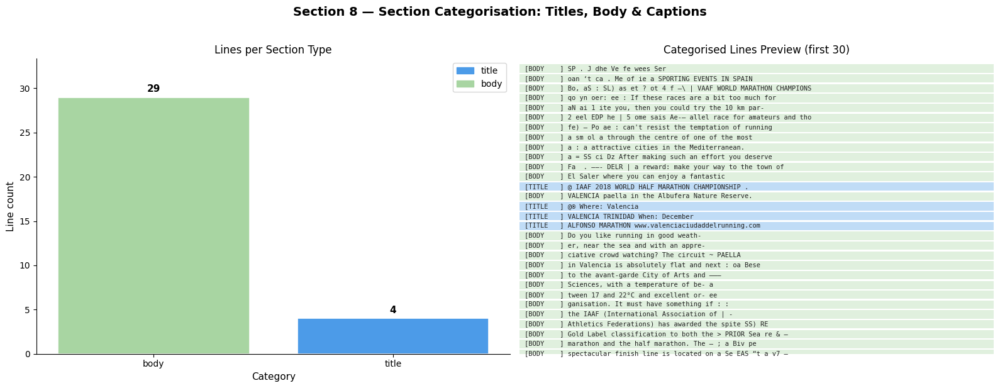

In [152]:
# ── Rule-based section categorisation with visual report ───────────────
import re
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

CAPTION_RE = re.compile(
    r'^(figure|fig\.?|table|tbl\.?|caption|chart|diagram)\s*\d*[:.)\]?]',
    re.IGNORECASE
)

def categorise_line(line: str) -> str:
    s = line.strip()
    if not s:
        return 'empty'
    if CAPTION_RE.match(s):
        return 'caption'
    words = s.split()
    if len(words) <= 12 and len(s) <= 80:
        cap_ratio = sum(1 for w in words if w[:1].isupper()) / max(len(words), 1)
        if s.isupper() or cap_ratio >= 0.6:
            return 'title'
    return 'body'

lines       = [l for l in ocr_text.split('\n') if l.strip()]
categorised = [(categorise_line(l), l.strip()) for l in lines]

# Build DataFrame (re-used in Phase 3)
sections_df = pd.DataFrame(categorised, columns=['section_type', 'text'])

# ── Colour palette per category ──────────────────────────────────────
CAT_COLOURS = {'title': '#4c9be8', 'body': '#a8d5a2', 'caption': '#f4a261', 'empty': '#e0e0e0'}
counts = sections_df['section_type'].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Section 8 — Section Categorisation: Titles, Body & Captions',
             fontsize=14, fontweight='bold', y=1.02)

# ── Left: bar chart of category distribution ─────────────────────────
ax = axes[0]
bar_colours = [CAT_COLOURS.get(c, '#cccccc') for c in counts.index]
bars = ax.bar(counts.index, counts.values, color=bar_colours, edgecolor='white', linewidth=1.2)
ax.bar_label(bars, padding=4, fontsize=11, fontweight='bold')
ax.set_title('Lines per Section Type', fontsize=12)
ax.set_xlabel('Category', fontsize=11)
ax.set_ylabel('Line count', fontsize=11)
ax.spines[['top', 'right']].set_visible(False)
ax.set_ylim(0, counts.max() * 1.15)
legend_patches = [mpatches.Patch(color=v, label=k) for k, v in CAT_COLOURS.items() if k in counts.index]
ax.legend(handles=legend_patches, fontsize=10)

# ── Right: colour-coded line preview (first 30 non-empty lines) ───────────
ax2 = axes[1]
ax2.set_xlim(0, 1)
preview = [(c, t) for c, t in categorised if c != 'empty'][:30]
ax2.set_ylim(0, len(preview))
ax2.axis('off')
ax2.set_title('Categorised Lines Preview (first 30)', fontsize=12)
for row_i, (cat, text) in enumerate(reversed(preview)):
    colour = CAT_COLOURS.get(cat, '#dddddd')
    ax2.barh(row_i, 1, color=colour, alpha=0.35, height=0.85)
    label = f'[{cat.upper():<8}] {text[:62]}'
    ax2.text(0.01, row_i, label, va='center', fontsize=7.5,
             color='#222222', fontfamily='monospace')

plt.tight_layout()
plt.show()


---
## 9. Sentiment Analysis — VADER scores each sentence as positive, negative, or neutral.

VADER is applied to the whole document and to the first 10 sentences individually. A `compound` score ≥ +0.05 is positive, ≤ −0.05 is negative, otherwise neutral.

In [153]:
# ── Sentiment analysis with VADER ────────────────────────────────
# Reference: VADER sentiment (Hutto & Gilbert, 2014) — https://www.nltk.org/api/nltk.sentiment.vader.html
import nltk
# Had to manual download the vader_lexicon
#nltk.download('vader_lexicon', quiet=True)
from nltk.sentiment.vader import SentimentIntensityAnalyzer

sia = SentimentIntensityAnalyzer()

# Whole-document sentiment
overall = sia.polarity_scores(ocr_text)
print('=== Overall document sentiment ===')
for k, v in overall.items():
    print(f'  {k:<10}: {v:+.3f}')

if   overall['compound'] >=  0.05: label = 'POSITIVE'
elif overall['compound'] <= -0.05: label = 'NEGATIVE'
else:                              label = 'NEUTRAL'
print(f'\n  -> Document classified as {label} (compound = {overall["compound"]:+.3f})')

# Per-sentence sentiment for the first 10 sentences
print('\n=== Per-sentence sentiment (first 10) ===')
for i, sent in enumerate(sentences[:10]):
    s = sia.polarity_scores(sent)
    snippet = sent[:65].replace('\n', ' ')
    print(f'  [compound={s["compound"]:+.2f}] {snippet}')


=== Overall document sentiment ===
  neg       : +0.025
  neu       : +0.857
  pos       : +0.118
  compound  : +0.978

  -> Document classified as POSITIVE (compound = +0.978)

=== Per-sentence sentiment (first 10) ===
  [compound=+0.00] J dhe Ve fe wees Ser
  [compound=+0.00] oan ‘t ca
  [compound=+0.00] Me of ie a SPORTING EVENTS IN SPAIN
  [compound=+0.00] Bo, aS : SL) as et
  [compound=+0.56] ot 4 f —\ | VAAF WORLD MARATHON CHAMPIONSHIP
  [compound=+0.00] qo yn oer: ee : If these races are a bit too much for
  [compound=+0.00] aN ai 1 ite you, then you could try the 10 km par-
  [compound=+0.00] 2 eel EDP he | 5 ome sais Ae-— allel race for amateurs and those 
  [compound=-0.56] fe) — Po ae : can't resist the temptation of running
  [compound=+0.00] a sm ol a through the centre of one of the most


---
# Image Feature Engineering Pipeline
### Extract embedded figure → preprocess → detect features → label regions → draw bounding boxes
---

Phase 2 extracts the largest embedded raster image from the PDF page set in Section 0 and runs the full image feature pipeline on it. All Phase 2 cells and Phase 3's spatial join operate on this extracted figure.

## 2.0  Image Pipeline Imports — OpenCV, NumPy, PIL, and pypdfium2 loaded for Phase 2.

In [154]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from collections import Counter
import pandas as pd

print(f'OpenCV version: {cv2.__version__}')
print('Scene feature engineering imports ready.')

OpenCV version: 4.13.0
Scene feature engineering imports ready.


---
## 2.0a  Embedded Image Extraction — saves the largest raster figure from the PDF page to `doc_largest_image.png`.

pypdfium2 walks the page objects, filters for raster images, and saves the largest by pixel area. If no image is found, check the PDF and try a different `PAGE_NUM`.

Page 5 of 'Eventos-deportivos-EN.pdf': found 4 embedded raster image(s)
  image 1: 495 x 775 px (mode=RGB)
  image 2: 1264 x 784 px (mode=RGB)
  image 3: 1151 x 627 px (mode=RGB)
  image 4: 1264 x 690 px (mode=RGB)

Selected image 2 (largest, 1264 x 784 px).
Saved as: doc_largest_image.png


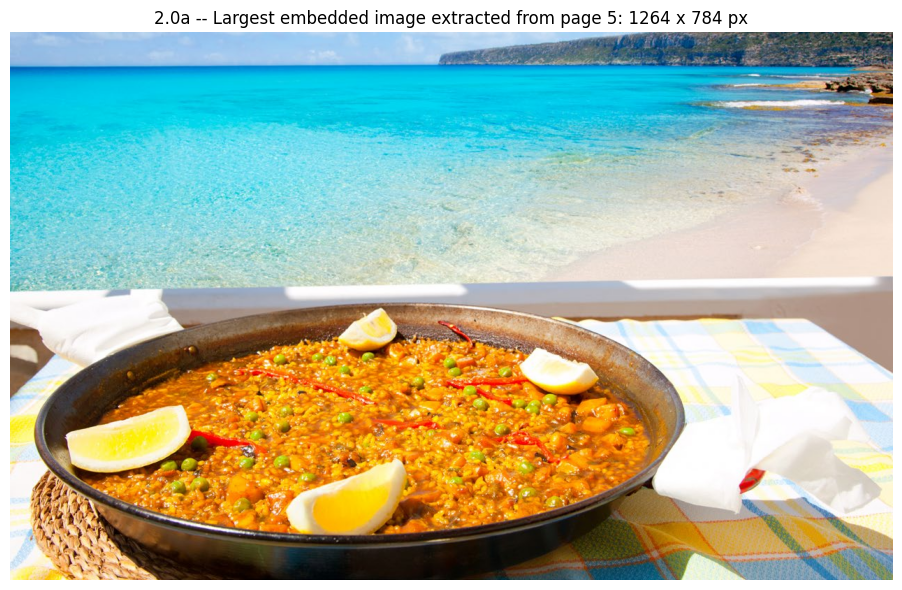

In [155]:
# -- Section 2.0a: only runs when the source is a PDF ----------------------
# Reference: pypdfium2 embedded image extraction — https://pypdfium2.readthedocs.io/en/stable/
if PDF_FILE is None:
    print(f'Source is not a PDF ("{SOURCE_FILE}") — embedded image extraction skipped.')
    # For image sources, use the input image itself as the extracted figure.
    # For text sources, Phase 2 image steps will have nothing to work with.
    EXTRACTED_IMAGE = RENDERED_PNG if RENDERED_PNG else None
else:
    # -- Locate the largest embedded image on the page chosen in Section 0 ----
    # PDF_FILE and PAGE_NUM are inherited from Section 0 -- the single place
    # where you pick the document and the page. Each PDF page object has a
    # `.type` field; raster images are type 3.
    import pypdfium2 as _pdfium
    from PIL import Image
    
    EXTRACTED_IMAGE = 'doc_largest_image.png'
    
    doc = _pdfium.PdfDocument(PDF_FILE)
    if PAGE_NUM >= len(doc):
        raise IndexError(
            f'PAGE_NUM={PAGE_NUM} but {PDF_FILE!r} only has {len(doc)} pages. '
            'Set PAGE_NUM in Section 0 to a valid page number.'
        )
    
    page = doc[PAGE_NUM]
    img_objs = [o for o in page.get_objects() if o.type == 3]
    print(f'Page {PAGE_NUM+1} of {PDF_FILE!r}: found {len(img_objs)} embedded raster image(s)')
    
    if not img_objs:
        print('no image found')
    else:
        # Render each image object to a PIL image, record dimensions, pick the largest.
        candidates = []
        for j, obj in enumerate(img_objs):
            bm = obj.get_bitmap(render=False)
            pil = bm.to_pil()
            candidates.append((pil.width * pil.height, j, pil))
            print(f'  image {j+1}: {pil.width} x {pil.height} px (mode={pil.mode})')
    
        candidates.sort(reverse=True)            # largest first
        _, chosen_idx, chosen_img = candidates[0]
        print(f'\nSelected image {chosen_idx+1} (largest, '
              f'{chosen_img.width} x {chosen_img.height} px).')
    
        # Save to disk so the WK6-lab cv2.imread pattern in Sec. 2.1 just works.
        chosen_img.save(EXTRACTED_IMAGE)
        print(f'Saved as: {EXTRACTED_IMAGE}')
    
        # Quick visual confirmation
        plt.figure(figsize=(10, 6))
        plt.imshow(chosen_img)
        plt.axis('off')
        plt.title(f'2.0a -- Largest embedded image extracted from page {PAGE_NUM+1}: '
                  f'{chosen_img.width} x {chosen_img.height} px')
        plt.tight_layout()
        plt.show()
    
    doc.close()


---
## 2.1  Preprocessing — grayscale conversion, Gaussian blur, and Otsu binarisation.

The extracted figure is converted to grayscale and blurred to suppress noise, then binarised with Otsu's method to produce a clean foreground mask for region detection.

Phase 2 source: doc_largest_image.png
Image size            : 1264 x 784 pixels
Mean intensity (gray) : 167.9


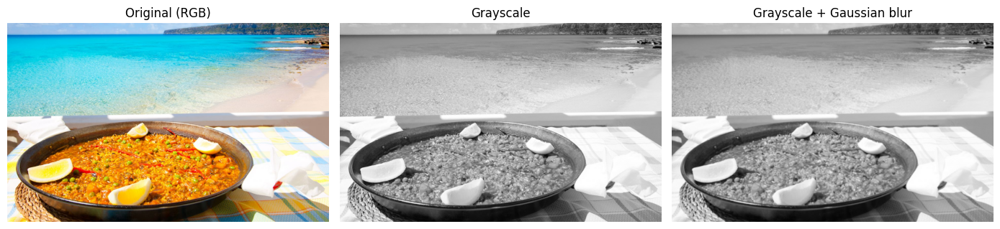

In [156]:
# -- Load image for Phase 2 layout analysis -----------------------------
# Primary source: doc_largest_image.png extracted by Section 2.0a.
# Fallback: RENDERED_PNG (full page) if no embedded image was found.
# Pattern from WK6 Lab Code: cv2.imread + cvtColor + GaussianBlur.

import os as _os
IMAGE_FILE = (
    EXTRACTED_IMAGE
    if (EXTRACTED_IMAGE and _os.path.exists(str(EXTRACTED_IMAGE)))
    else RENDERED_PNG
)
print("Phase 2 source:", IMAGE_FILE)

img_bgr = cv2.imread(IMAGE_FILE)
if img_bgr is None:
    raise FileNotFoundError(
        "Could not load '" + str(IMAGE_FILE) + "'. "
        "Check that Section 0 and 2.0a ran successfully."
    )

# -- Step 1 -- Colour-space conversions (WK6 lab) -----------------------
img_rgb  = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)   # for Matplotlib display
img_hsv  = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)   # for HSV colour analysis in Sec. 2.7
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)  # for thresholding / edges

# -- Step 2 -- Noise reduction (WK6 lab) --------------------------------
img_blur = cv2.GaussianBlur(img_gray, (5, 5), 0)

H, W = img_gray.shape
print("Image size            :", W, "x", H, "pixels")
print("Mean intensity (gray) :", round(float(img_blur.mean()), 1))

# -- Display preprocessing stages ---------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(14, 6))
axes[0].imshow(img_rgb);               axes[0].set_title("Original (RGB)")
axes[1].imshow(img_gray, cmap="gray"); axes[1].set_title("Grayscale")
axes[2].imshow(img_blur, cmap="gray"); axes[2].set_title("Grayscale + Gaussian blur")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()


---
## 2.2  Feature Detection — Canny edges, Shi–Tomasi corners, and morphological block mask.

Canny edges and Shi–Tomasi keypoints map the structural boundaries of the image. Otsu binarisation followed by a horizontal morphological close groups characters into paragraph-level blobs for connected-component analysis.

Otsu auto-threshold value: 158
Canny edge pixels : 48,593
Corner keypoints  : 400
Block mask pixels : 508,789 (51.3% of page)


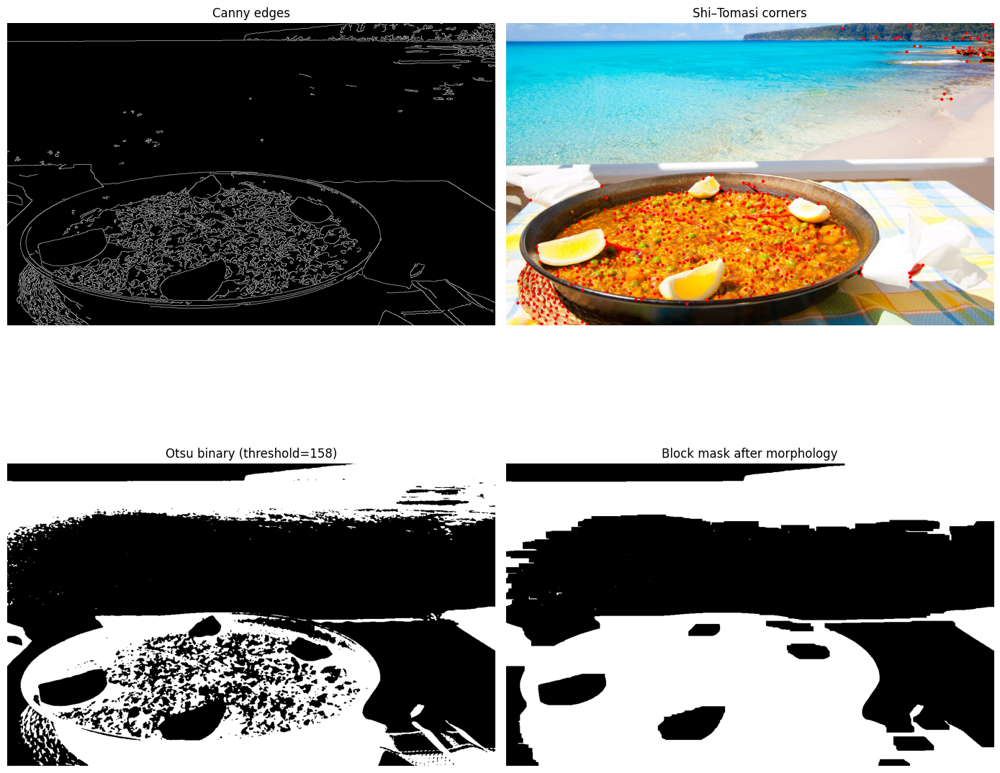

In [157]:
# ── Canny edge detection ───────────────────────────────────────
# Reference: OpenCV Canny tutorial
# https://docs.opencv.org/4.x/da/d22/tutorial_py_canny.html
edges = cv2.Canny(img_blur, threshold1=60, threshold2=160)

# ── Shi–Tomasi corner keypoints ────────────────────────────────
# Reference: OpenCV goodFeaturesToTrack tutorial
# https://docs.opencv.org/4.x/d4/d8c/tutorial_py_shi_tomasi.html
corners = cv2.goodFeaturesToTrack(
    img_blur, maxCorners=400, qualityLevel=0.01, minDistance=10
)
img_corners = img_rgb.copy()
if corners is not None:
    for pt in corners.astype(int).reshape(-1, 2):
        cv2.circle(img_corners, tuple(pt), 4, (255, 0, 0), -1)

# ── Otsu binarisation (WK6 Lab — cv2.threshold) ─────────────────
# THRESH_BINARY_INV : flip output so text -> 255, background -> 0
# THRESH_OTSU       : auto-pick threshold from the image histogram
otsu_value, binary = cv2.threshold(
    img_blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
)
print(f'Otsu auto-threshold value: {otsu_value:.0f}')

# ── Group characters into text blocks via morphological closing ─
# A horizontal kernel merges adjacent characters into line blobs;
# the slight vertical extent merges line blobs into paragraph blobs.
# Reference: OpenCV morphology tutorial
# https://docs.opencv.org/4.x/d9/d61/tutorial_py_morphological_ops.html
block_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (60, 12))
block_mask   = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, block_kernel)

# Single-mask layout pipeline: each connected component of `block_mask`
# is one document region. Sec. 2.3 classifies them by shape.
masks = {'block': block_mask}

# ── Stats ──────────────────────────────────────────────────────
print(f'Canny edge pixels : {int(edges.sum() // 255):,}')
print(f'Corner keypoints  : {0 if corners is None else len(corners)}')
print(f'Block mask pixels : {int(block_mask.sum() // 255):,} '
      f'({100 * int(block_mask.sum() // 255) / (H * W):.1f}% of page)')

# ── Visualisation ──────────────────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(14, 14))
axes[0, 0].imshow(edges, cmap='gray');      axes[0, 0].set_title('Canny edges')
axes[0, 1].imshow(img_corners);             axes[0, 1].set_title('Shi–Tomasi corners')
axes[1, 0].imshow(binary, cmap='gray');     axes[1, 0].set_title(f'Otsu binary (threshold={otsu_value:.0f})')
axes[1, 1].imshow(block_mask, cmap='gray'); axes[1, 1].set_title('Block mask after morphology')
for ax in axes.ravel():
    ax.axis('off')
plt.tight_layout()
plt.show()


---
## 2.3  Region Labelling — connected components classified by size and aspect ratio.

Each blob is labelled `dominant`, `major`, `minor`, `detail`, or `band` based on its area relative to the image and its aspect ratio. Labels are content-agnostic and work across documents, charts, and photographs.

In [158]:
# Reference: OpenCV connectedComponentsWithStats — https://docs.opencv.org/4.x/d3/dc0/group__imgproc__shape.html
# Reference: Wong, K.Y., Casey, R.G., & Wahl, F.M. (1982). Document analysis system. IBM J. Res. Dev. 26(6). https://doi.org/10.1147/rd.266.0647
# Region colour palette
REGION_COLOURS = {
    "dominant" : ( 40, 160,  60),   # green  - covers > 15% of image
    "major"    : ( 30,  60, 200),   # blue   - covers 5-15%
    "minor"    : (220, 120,   0),   # orange - covers 1-5%
    "detail"   : (110, 110, 110),   # grey   - small isolated feature
    "band"     : (180,  60, 200),   # purple - elongated strip
}

MIN_AREA_RATIO = 0.001
min_area       = int(MIN_AREA_RATIO * H * W)

# ── Generic region classifier ─────────────────────────────────────────
# Labels are based on size relative to the image and aspect ratio only.
# No document-specific assumptions (no "header", "paragraph" etc.).
# Works for photographs, charts, diagrams, and document pages alike.
def classify_region(x, y, w, h, raw_mask=None):
    area       = w * h
    aspect     = w / max(h, 1)
    area_ratio = area / (H * W)

    # Elongated band -- very wide or very tall strip
    if aspect > 5 or aspect < 0.2:
        return "band"

    # Size-based labels
    if area_ratio > 0.15:
        return "dominant"
    elif area_ratio > 0.05:
        return "major"
    elif area_ratio > 0.01:
        return "minor"
    else:
        return "detail"

def extract_regions_from_mask(mask, default_label, raw_mask=None):
    n, _labels, stats, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)
    out = []
    for i in range(1, n):
        x, y, w, h, area = stats[i]
        if area < min_area:
            continue
        label = classify_region(x, y, w, h, raw_mask=raw_mask)
        out.append((int(x), int(y), int(w), int(h), label))
    return out

# Gather all regions from the block mask
region_records = extract_regions_from_mask(block_mask, "block", raw_mask=binary)

# Sort largest first so small regions draw on top
region_records.sort(key=lambda r: r[2] * r[3], reverse=True)

print("Detected", len(region_records), "regions >=" , round(MIN_AREA_RATIO * 100, 1), "% of image area")
from collections import Counter
type_counts = Counter(r[4] for r in region_records)
for t in REGION_COLOURS:
    print(" ", t.ljust(10), ":", type_counts.get(t, 0))


Detected 3 regions >= 0.1 % of image area
  dominant   : 1
  major      : 0
  minor      : 0
  detail     : 1
  band       : 1


---
## 2.4  Bounding Boxes — colour-coded rectangles drawn over each region.
Green = dominant, blue = major, orange = minor, grey = detail, purple = band.


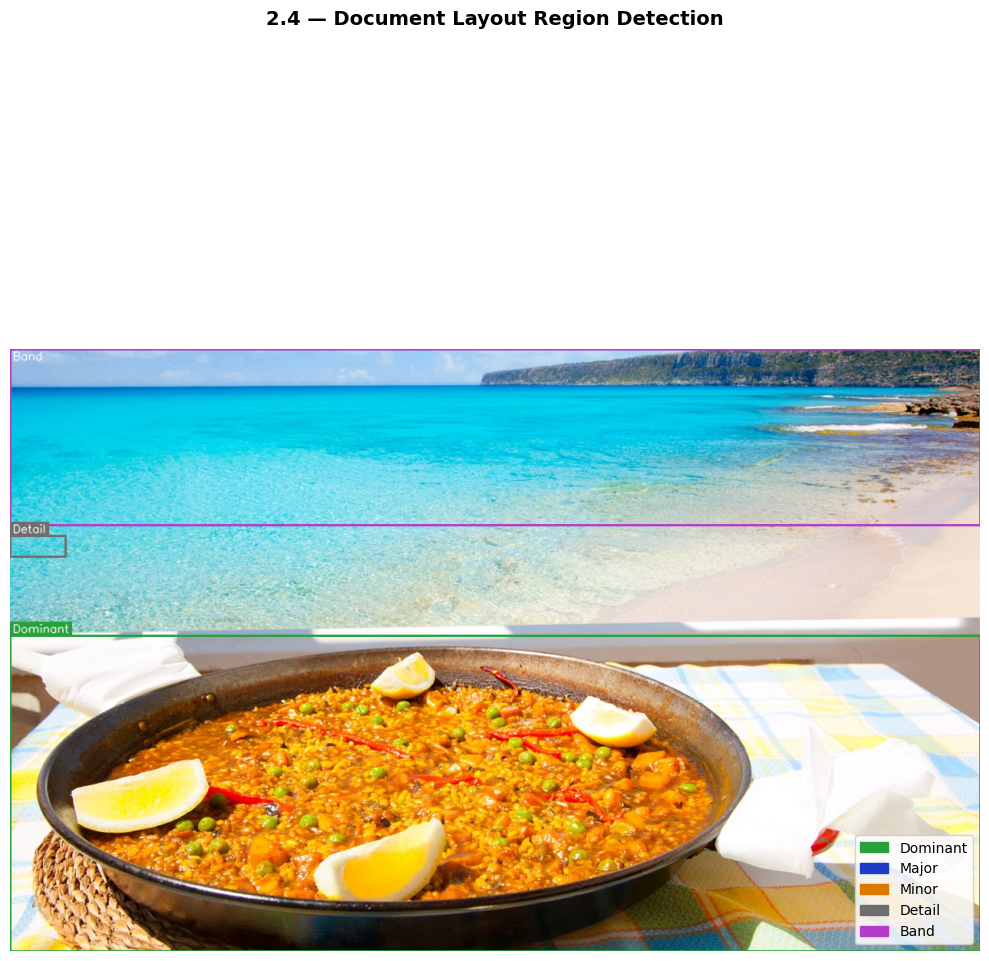

In [159]:
# ── Draw bounding boxes and text labels ────────────────────
# Uses REGION_COLOURS defined in Sec. 2.3.
# cv2.rectangle / cv2.putText pattern: WK6 Lab Code.
annotated = img_rgb.copy()
font = cv2.FONT_HERSHEY_SIMPLEX

for (x, y, w, h, rtype) in region_records:

    colour = REGION_COLOURS.get(rtype, (200, 200, 200))   # fallback grey
    label  = rtype.replace('_', ' ').title()

    # Bounding rectangle
    cv2.rectangle(annotated, (x, y), (x + w, y + h), colour, 2)

    # Filled label background then white text
    (tw, th), _ = cv2.getTextSize(label, font, 0.50, 1)
    cv2.rectangle(annotated, (x, max(y - th - 6, 0)), (x + tw + 6, y), colour, -1)
    cv2.putText(annotated, label, (x + 3, max(y - 4, th + 2)),
                font, 0.50, (255, 255, 255), 1, cv2.LINE_AA)

# ── Show the annotated document ───────────────────────
fig, ax = plt.subplots(figsize=(10, 13))
ax.imshow(annotated)
ax.axis('off')
plt.suptitle('2.4 — Document Layout Region Detection',
             fontsize=14, fontweight='bold')

# Legend
legend_patches = [mpatches.Patch(color=np.array(c) / 255, label=t.replace('_', ' ').title())
                  for t, c in REGION_COLOURS.items()]
ax.legend(handles=legend_patches, loc='lower right', framealpha=0.85)
plt.tight_layout(); plt.show()


---
## 2.5  Lab7a Techniques — blurring, thresholding, morphological operations, gradients, and histograms.

Lab7a techniques are applied to the extracted figure: three blurring filters, binary and adaptive thresholding, morphological transforms, Sobel/Laplacian gradients, and a pixel histogram.

### 2.5.1  Blurring — 2D convolution, Gaussian, and median filters.

Three blur kernels are applied and compared side by side. Median blur is most effective against salt-and-pepper noise common in scanned documents.

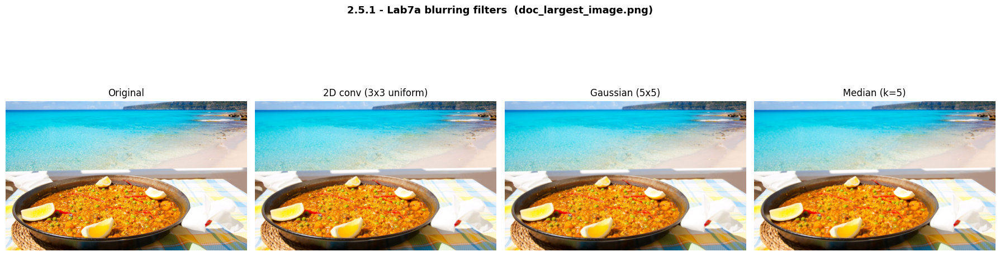

In [160]:
# Lab7a 2.5.1 - three blurring filters
# img_rgb was loaded in Section 2.1 (extracted figure or rendered page fallback).
# Lab7a pattern: cv2.filter2D, cv2.GaussianBlur, cv2.medianBlur.

# 1. 2D convolution - uniform 3x3 averaging kernel (Lab7a Cell 35)
kernel_2d   = np.ones((3, 3), dtype=np.float32) / 9.0
blur_2d     = cv2.filter2D(img_rgb, -1, kernel_2d)

# 2. Gaussian blur (Lab7a Cell 39)
blur_gauss  = cv2.GaussianBlur(img_rgb, (5, 5), 0)

# 3. Median blur - robust to salt-and-pepper noise (Lab7a Cell 43)
blur_median = cv2.medianBlur(img_rgb, 5)

fig, axes = plt.subplots(1, 4, figsize=(18, 6))
axes[0].imshow(img_rgb);     axes[0].set_title("Original")
axes[1].imshow(blur_2d);     axes[1].set_title("2D conv (3x3 uniform)")
axes[2].imshow(blur_gauss);  axes[2].set_title("Gaussian (5x5)")
axes[3].imshow(blur_median); axes[3].set_title("Median (k=5)")
for ax in axes: ax.axis("off")
plt.suptitle("2.5.1 - Lab7a blurring filters  (" + IMAGE_FILE + ")", fontsize=13, fontweight="bold")
plt.tight_layout(); plt.show()


### 2.5.2  Thresholding — fixed binary cutoff versus adaptive local thresholding.

A fixed threshold at 127 is compared against Otsu (Sec. 2.2) and two adaptive variants (mean and Gaussian neighbourhood). Adaptive thresholding handles uneven lighting on scanned pages better than a single global cutoff.

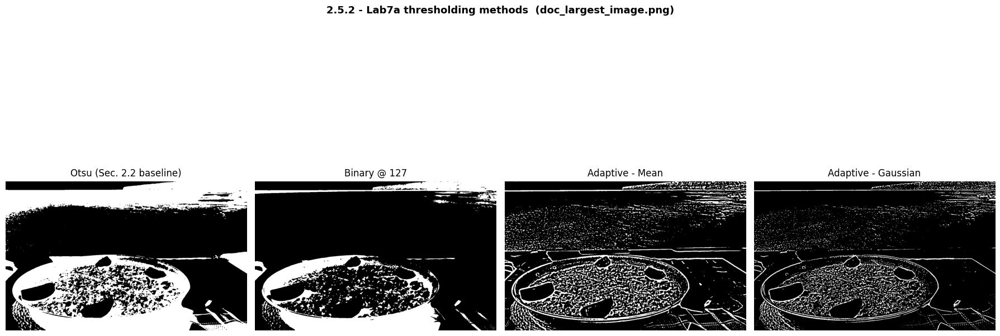

Adaptive thresholding gives a per-pixel cutoff -> handles uneven lighting.


In [161]:
# Lab7a 2.5.2 - binary + adaptive thresholding
# img_blur and binary are from Sections 2.1 / 2.2 (extracted figure or fallback).

# Plain binary threshold at fixed cutoff 127 (Lab7a Cell 48)
_, thresh_binary = cv2.threshold(img_blur, 127, 255, cv2.THRESH_BINARY_INV)

# Adaptive - mean of local neighbourhood (Lab7a Cell 54)
thresh_adapt_mean = cv2.adaptiveThreshold(
    img_blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
    cv2.THRESH_BINARY_INV, 15, 8,
)

# Adaptive - Gaussian-weighted local neighbourhood (Lab7a Cell 55)
thresh_adapt_gauss = cv2.adaptiveThreshold(
    img_blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY_INV, 15, 8,
)

fig, axes = plt.subplots(1, 4, figsize=(18, 9))
axes[0].imshow(binary,             cmap="gray"); axes[0].set_title("Otsu (Sec. 2.2 baseline)")
axes[1].imshow(thresh_binary,      cmap="gray"); axes[1].set_title("Binary @ 127")
axes[2].imshow(thresh_adapt_mean,  cmap="gray"); axes[2].set_title("Adaptive - Mean")
axes[3].imshow(thresh_adapt_gauss, cmap="gray"); axes[3].set_title("Adaptive - Gaussian")
for ax in axes: ax.axis("off")
plt.suptitle("2.5.2 - Lab7a thresholding methods  (" + IMAGE_FILE + ")", fontsize=13, fontweight="bold")
plt.tight_layout(); plt.show()
print("Adaptive thresholding gives a per-pixel cutoff -> handles uneven lighting.")


---
## 2.6  Crop Gallery — the three largest regions of each type cropped and displayed.

Visual spot-check of region classification accuracy. Coloured spine borders match the bounding-box palette from Sec. 2.4.

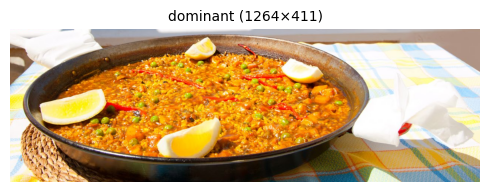

[major] No regions detected.
[minor] No regions detected.


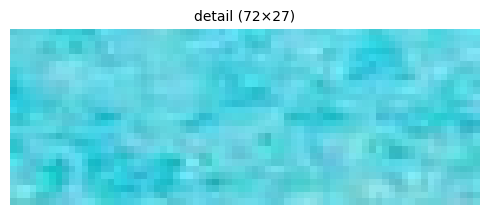

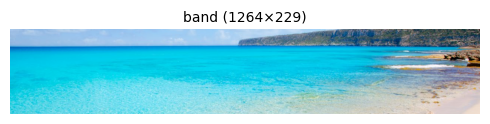

In [162]:
MAX_EXAMPLES = 3

for rtype, colour in REGION_COLOURS.items():
    examples = [(x, y, w, h) for (x, y, w, h, rt) in region_records if rt == rtype]
    if not examples:
        print(f'[{rtype}] No regions detected.')
        continue

    # Sort largest-first, take up to MAX_EXAMPLES
    examples.sort(key=lambda r: r[2] * r[3], reverse=True)
    show = examples[:MAX_EXAMPLES]
    colour_norm = tuple(c / 255 for c in colour)

    fig, axes = plt.subplots(1, len(show), figsize=(5 * len(show), 4))
    if len(show) == 1:
        axes = [axes]
    for ax, (x, y, w, h) in zip(axes, show):
        crop = img_rgb[y:y + h, x:x + w]
        ax.imshow(crop)
        ax.set_title(f'{rtype} ({w}×{h})', fontsize=10)
        ax.axis('off')
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_edgecolor(colour_norm)
            spine.set_linewidth(3)
    plt.tight_layout(); plt.show()

---
## 2.7  Region Summary Table — all detected regions in a styled DataFrame.

Each region's geometry, fill ratio, and mean HSV values are compiled into a table with heatmap styling to highlight the largest and most saturated regions.

In [163]:
uncovered = np.zeros((H, W), dtype=np.uint8)  # fallback mask for rtypes not in masks

rows = []
for (x, y, w, h, rtype) in region_records:
    area   = w * h
    aspect = round(w / (h + 1e-6), 2)

    # Fill ratio = fraction of bbox inside this region's own colour mask
    ref_mask = masks.get(rtype, uncovered)
    fg       = int((ref_mask[y:y + h, x:x + w] > 0).sum())
    fill     = round(fg / (area + 1e-6), 3)

    # Mean HSV inside the bounding box — colour fingerprint of the region
    crop_hsv = img_hsv[y:y + h, x:x + w]
    mean_h   = round(float(crop_hsv[:, :, 0].mean()), 1)
    mean_s   = round(float(crop_hsv[:, :, 1].mean()), 1)
    mean_v   = round(float(crop_hsv[:, :, 2].mean()), 1)

    rows.append({
        'Region Type'  : rtype,
        'X'            : x,
        'Y'            : y,
        'Width'        : w,
        'Height'       : h,
        'Area (px^2)'  : area,
        'Aspect (w/h)' : aspect,
        'Fill Ratio'   : fill,
        'Mean H'       : mean_h,
        'Mean S'       : mean_s,
        'Mean V'       : mean_v,
    })

df_regions = (
    pd.DataFrame(rows)
      .sort_values(['Region Type', 'Area (px^2)'], ascending=[True, False])
      .reset_index(drop=True)
)

print(f'Total regions in summary table: {len(df_regions)}')
(df_regions.style
    .background_gradient(subset=['Area (px^2)'],  cmap='YlOrBr')
    .background_gradient(subset=['Fill Ratio'],   cmap='Greens')
    .background_gradient(subset=['Mean S'],       cmap='PuRd')
    .set_caption('Detected Scene Regions — Sorted by Type & Area')
    .set_table_styles([{'selector': 'caption',
                        'props': [('font-size', '13px'),
                                  ('font-weight', 'bold')]}]))

Total regions in summary table: 3


,Region Type,X,Y,Width,Height,Area (px^2),Aspect (w/h),Fill Ratio,Mean H,Mean S,Mean V
0,band,0,0,1264,229,289456,5.520000,0.000000,89.900000,145.500000,211.700000
1,detail,0,243,72,27,1944,2.670000,0.000000,93.200000,155.600000,223.100000
2,dominant,0,373,1264,411,519504,3.080000,0.000000,33.700000,132.100000,191.800000


---
# Phase 3 — Multi-Modal Integration
### OCR Word Boxes → Spatial Join → Unified JSON → Summary Report
---

Phase 3 merges Phase 1 NLP outputs with Phase 2 image regions into a single structured record per region. The pipeline re-runs Tesseract in data mode for word bounding boxes, spatially joins them to regions, then exports a JSON file and summary table.

## 3.1  Word Bounding Boxes — Tesseract re-run in data mode for per-word geometry.

`pytesseract.image_to_data` returns each word's `(left, top, width, height)` alongside its text and confidence score. Phase 1 used `image_to_string` which discards this geometry.

In [164]:
# -- OCR with word-level bounding boxes ------------------------------------
# Phase 1 used pytesseract.image_to_string (raw text only).
# image_to_data runs the SAME OCR pass but returns per-word geometry
# (left, top, width, height, conf), which is what Phase 3 needs.
#
# Reference: pytesseract.image_to_data
#   https://github.com/madmaze/pytesseract
# Reference: Tesseract TSV output columns
#   https://tesseract-ocr.github.io/tessdoc/Command-Line-Usage.html
#
# img_bgr was loaded in Sec. 2.1 via cv2.imread (WK6 lab pattern).

custom_config = r'--oem 1 --psm 6'   # same engine + page-segmentation as Phase 1

ocr_data = pytesseract.image_to_data(
    img_bgr,
    config=custom_config,
    output_type=pytesseract.Output.DICT,
)

# Keep only rows where Tesseract emitted an actual word with non-zero confidence
words = []
for i in range(len(ocr_data['text'])):
    txt  = ocr_data['text'][i].strip()
    raw_conf = ocr_data['conf'][i]
    try:
        conf = float(raw_conf)
    except (TypeError, ValueError):
        conf = -1.0
    if txt and conf > 0:
        words.append({
            'text' : txt,
            'conf' : round(conf, 1),
            'x'    : int(ocr_data['left'][i]),
            'y'    : int(ocr_data['top'][i]),
            'w'    : int(ocr_data['width'][i]),
            'h'    : int(ocr_data['height'][i]),
        })

print(f'Extracted {len(words)} word-level bounding boxes from OCR.')
print('First 5 words:')
for w in words[:5]:
    print(f"  '{w['text']:<20}' conf={w['conf']:>5}  bbox=({w['x']},{w['y']},{w['w']},{w['h']})")


Extracted 17 word-level bounding boxes from OCR.
First 5 words:
  'Neer                ' conf= 17.0  bbox=(64,600,112,37)
  'EB”                 ' conf= 18.0  bbox=(245,585,265,51)
  'MLE                 ' conf=  4.0  bbox=(601,601,34,31)
  're                  ' conf= 10.0  bbox=(741,591,44,73)
  'eee                 ' conf= 22.0  bbox=(918,608,14,19)


## 3.2  Spatial Join — each OCR word assigned to the region whose bounding box contains it.

A word belongs to a region if its centre point falls inside the region rectangle. Regions are processed smallest-first so words in overlapping boxes are attributed to the tighter region.

In [165]:
# -- Spatial join: assign each OCR word to a Phase-2 image region ----------
# Pure-Python point-in-rectangle test (the regions are axis-aligned).
# OpenCV equivalent for general contours: cv2.pointPolygonTest.

def _centre(word):
    return (word['x'] + word['w'] // 2, word['y'] + word['h'] // 2)

def _contains(region, point):
    rx, ry, rw, rh, _ = region
    px, py = point
    return rx <= px <= rx + rw and ry <= py <= ry + rh

# Build region_id -> [words] mapping. Iterate smallest-first so a word that
# falls inside both a tight text_line and the paragraph that wraps it is
# attributed to the tighter region.
regions_small_first = sorted(
    list(enumerate(region_records)),
    key=lambda ir: ir[1][2] * ir[1][3],
)

region_to_words = {i: [] for i, _ in regions_small_first}
unassigned = []

for w in words:
    centre = _centre(w)
    matched_id = None
    for i, region in regions_small_first:
        if _contains(region, centre):
            matched_id = i
            break
    if matched_id is None:
        unassigned.append(w)
    else:
        region_to_words[matched_id].append(w)

# Coverage stats
total = len(words)
assigned = total - len(unassigned)
print(f'Words assigned to a region : {assigned}/{total} ({assigned/total:.0%})')
print(f'Words outside any region   : {len(unassigned)}')

# Show top-5 most word-dense regions
dense = sorted(
    ((i, len(ws)) for i, ws in region_to_words.items()),
    key=lambda t: t[1], reverse=True
)[:5]
print()
print('Top-5 word-dense regions:')
for rid, n in dense:
    if n == 0:
        break
    x, y, w_, h_, rtype = region_records[rid]
    print(f'  region #{rid:>3}  type={rtype:<10}  bbox=({x},{y},{w_},{h_})  words={n}')


Words assigned to a region : 17/17 (100%)
Words outside any region   : 0

Top-5 word-dense regions:
  region #  0  type=dominant    bbox=(0,373,1264,411)  words=17


## 3.3  Unified Overlay — region boxes and OCR word boxes drawn on the same image.

Thick colour-coded rectangles show Phase 2 regions; thin yellow rectangles show individual OCR word boxes. Visual confirmation that the spatial join matched words to the correct regions.

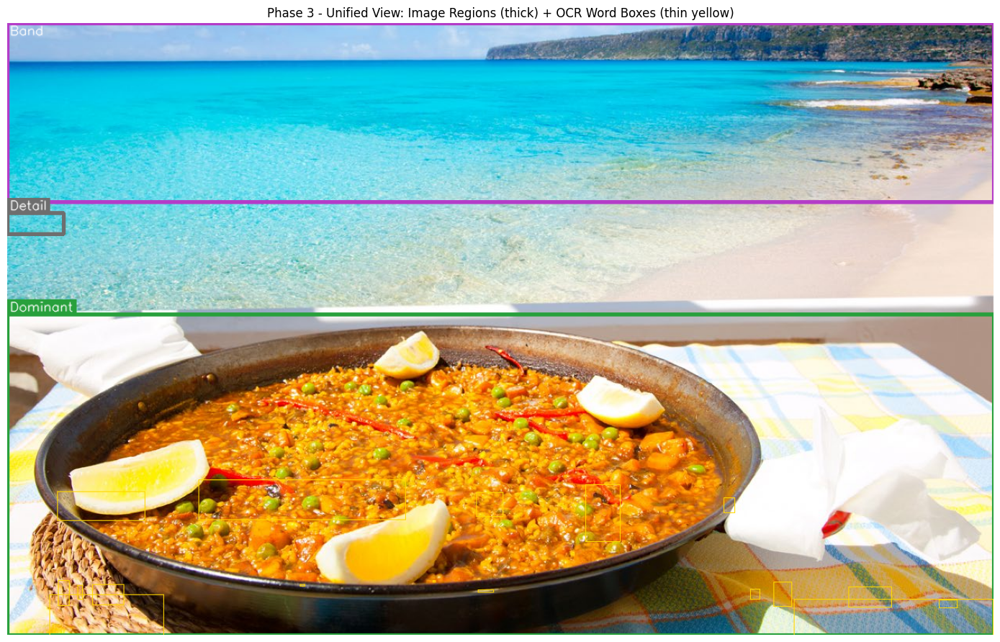

Saved unified annotated image to 'ca2_doc_phase3_unified.png'


In [166]:
# -- Unified annotated overlay: region boxes + OCR word boxes --------------
# Uses WK6 lab patterns end-to-end (cv2.rectangle, cv2.putText, cv2.imwrite).

unified = img_rgb.copy()
font = cv2.FONT_HERSHEY_SIMPLEX

# 1. Region rectangles (thick) -- same palette as Sec. 2.4
for (x, y, w_, h_, rtype) in region_records:
    colour = REGION_COLOURS.get(rtype, (200, 200, 200))
    cv2.rectangle(unified, (x, y), (x + w_, y + h_), colour, 3)

# 2. OCR word rectangles (thin yellow) layered on top
WORD_COLOUR = (255, 215, 0)
for w in words:
    cv2.rectangle(
        unified,
        (w['x'], w['y']),
        (w['x'] + w['w'], w['y'] + w['h']),
        WORD_COLOUR, 1,
    )

# 3. Region-type labels -- cv2.putText pattern from WK6
for (x, y, w_, h_, rtype) in region_records:
    colour = REGION_COLOURS.get(rtype, (200, 200, 200))
    label  = rtype.replace('_', ' ').title()
    (tw, th), _ = cv2.getTextSize(label, font, 0.55, 1)
    cv2.rectangle(unified, (x, max(y - th - 6, 0)), (x + tw + 6, y), colour, -1)
    cv2.putText(unified, label, (x + 3, max(y - 4, th + 2)),
                font, 0.55, (255, 255, 255), 1, cv2.LINE_AA)

plt.figure(figsize=(14, 18))
plt.imshow(unified)
plt.title('Phase 3 - Unified View: Image Regions (thick) + OCR Word Boxes (thin yellow)')
plt.axis('off')
plt.tight_layout()
plt.show()

# -- Save the unified figure to disk (WK6 lab: cv2.imwrite) ----------------
OUT_PNG = 'ca2_doc_phase3_unified.png'
cv2.imwrite(OUT_PNG, cv2.cvtColor(unified, cv2.COLOR_RGB2BGR))
print(f"Saved unified annotated image to '{OUT_PNG}'")


## 3.4  JSON Output — each region exported as a structured record with geometry, text, entities, and sentiment.

One JSON object per region combines bounding box, OCR text, spaCy entities, and VADER sentiment scores. The full document is written to `ca2_doc_multimodal.json`.

In [167]:
# -- Build the unified multi-modal record per region -----------------------
# Combines Phase-2 geometry with Phase-1 NLP outputs (NER, VADER).
#
# Reference: Python json module
#   https://docs.python.org/3/library/json.html

import json

multimodal = []
for i, (x, y, w_, h_, rtype) in enumerate(region_records):
    region_words = region_to_words.get(i, [])
    region_text  = ' '.join(w['text'] for w in region_words)

    # spaCy NER on this region's text only (re-uses `nlp` from Phase 1 cell 4)
    ents = []
    if region_text.strip():
        ents = [
            {'text': e.text, 'label': e.label_}
            for e in nlp(region_text).ents
        ]

    # VADER sentiment on this region's text (re-uses `sia` from Sec. 10)
    if region_text.strip():
        sent = sia.polarity_scores(region_text)
    else:
        sent = {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}

    multimodal.append({
        'region_id'   : i,
        'region_type' : rtype,
        'bbox'        : {'x': int(x), 'y': int(y), 'w': int(w_), 'h': int(h_)},
        'word_count'  : len(region_words),
        'ocr_text'    : region_text,
        'entities'    : ents,
        'sentiment'   : {k: round(v, 3) for k, v in sent.items()},
    })

# Persist the whole document to disk
OUT_JSON = 'ca2_doc_multimodal.json'
with open(OUT_JSON, 'w', encoding='utf-8') as f:
    json.dump({
        'source_image' : IMAGE_FILE,
        'page_size'    : {'height': int(H), 'width': int(W)},
        'n_regions'    : len(multimodal),
        'n_words'      : len(words),
        'regions'      : multimodal,
    }, f, indent=2, ensure_ascii=False)

print(f"Wrote '{OUT_JSON}' -- {len(multimodal)} regions, {len(words)} OCR words.")

# -- Preview the first text-bearing region ---------------------------------
preview = next((r for r in multimodal if r['word_count'] > 0), None)
if preview:
    print()
    print('=== Sample region record ===')
    print(json.dumps(preview, indent=2, ensure_ascii=False)[:1200])
else:
    print('No text-bearing region found to preview.')


Wrote 'ca2_doc_multimodal.json' -- 3 regions, 17 OCR words.

=== Sample region record ===
{
  "region_id": 0,
  "region_type": "dominant",
  "bbox": {
    "x": 0,
    "y": 373,
    "w": 1264,
    "h": 411
  },
  "word_count": 17,
  "ocr_text": "Neer EB” MLE re eee ¥, i AS ~ - _ = ms i. ch “oe Sr",
  "entities": [
    {
      "text": "MLE",
      "label": "ORG"
    },
    {
      "text": "¥",
      "label": "FAC"
    },
    {
      "text": "i. ch “oe Sr",
      "label": "PERSON"
    }
  ],
  "sentiment": {
    "neg": 0.0,
    "neu": 1.0,
    "pos": 0.0,
    "compound": 0.0
  }
}


## 3.5  Summary Report — per-region word counts, entity counts, and sentiment scores.

A compact DataFrame shows each region's geometry, text density, and sentiment, followed by headline insights across the whole page.

In [168]:
# -- Per-region summary table ----------------------------------------------
summary_rows = []
for r in multimodal:
    summary_rows.append({
        'Region'   : f"#{r['region_id']} {r['region_type']}",
        'BBox'     : f"({r['bbox']['x']},{r['bbox']['y']}) {r['bbox']['w']}x{r['bbox']['h']}",
        'Words'    : r['word_count'],
        'Entities' : len(r['entities']),
        'Compound' : r['sentiment']['compound'],
        'Snippet'  : (r['ocr_text'][:60] + '...') if len(r['ocr_text']) > 60 else r['ocr_text'],
    })

summary_df = pd.DataFrame(summary_rows)
print('=== Phase 3 Region Summary ===')
print(summary_df.to_string(index=False))

# -- Headline insights ------------------------------------------------------
text_regions = [r for r in multimodal if r['word_count'] > 0]
all_entities = [e for r in multimodal for e in r['entities']]
ent_counts   = Counter(e['label'] for e in all_entities)

print()
print('=== Headline Insights ===')
print(f'  Regions detected         : {len(multimodal)}')
print(f'  Regions carrying text    : {len(text_regions)}')
print(f'  Words placed in a region : {sum(r["word_count"] for r in multimodal)}/{len(words)}')
print(f'  Total NE mentions        : {len(all_entities)}')
if ent_counts:
    print('  Top entity types         : ' +
          ', '.join(f'{lbl}={cnt}' for lbl, cnt in ent_counts.most_common(5)))
if text_regions:
    densest = max(text_regions, key=lambda r: r['word_count'])
    print(f'  Densest text region      : #{densest["region_id"]} '
          f'({densest["region_type"]}) -- {densest["word_count"]} words')
    overall_compound = sum(r['sentiment']['compound'] for r in text_regions) / len(text_regions)
    print(f'  Mean region sentiment    : compound = {overall_compound:+.3f}')


=== Phase 3 Region Summary ===
     Region             BBox  Words  Entities  Compound                                             Snippet
#0 dominant (0,373) 1264x411     17         3       0.0 Neer EB” MLE re eee ¥, i AS ~ - _ = ms i. ch “oe Sr
    #1 band   (0,0) 1264x229      0         0       0.0                                                    
  #2 detail    (0,243) 72x27      0         0       0.0                                                    

=== Headline Insights ===
  Regions detected         : 3
  Regions carrying text    : 1
  Words placed in a region : 17/17
  Total NE mentions        : 3
  Top entity types         : ORG=1, FAC=1, PERSON=1
  Densest text region      : #0 (dominant) -- 17 words
  Mean region sentiment    : compound = +0.000


---
## 3.6  LLM Document Prediction — Ollama (llama3.2:3b)

TF-IDF keywords, noun chunks, named entities, and a text excerpt are passed to a locally-running Llama 3.2 (3B) model via the Ollama REST API. The model predicts the document's topic, type, and likely source. Requires `ollama serve` with `llama3.2:3b` pulled.

In [169]:
# -- Section 3.6  LLM Document Prediction via Ollama (llama3.2:3b) ----------
# Pattern adapted from CLI_2.ipynb (DBA project):
#   - streaming NDJSON via requests + iter_lines() (no ollama library needed)
#   - warm-up call to load the model into RAM before the main prompt
#   - temperature=0.1 for consistent, deterministic output
#   - 600 s timeout; ConnectionError caught separately for a clear message
#
# References:
#   Ollama REST API:  https://github.com/ollama/ollama/blob/main/docs/api.md
#   Meta Llama 3.2:   https://ollama.com/library/llama3.2

import json
import requests

OLLAMA_URL   = "http://localhost:11434/api/generate"
OLLAMA_MODEL = "llama3.2:3b"

# -- (1) Warm up the model ---------------------------------------------------
def _warm_up(model=OLLAMA_MODEL, url=OLLAMA_URL):
    print(f"Warming up '{model}' (may take 30-60 s on first run)...",
          end="", flush=True)
    try:
        requests.post(url, json={
            "model":  model,
            "prompt": "Reply with: ok",
            "stream": False,
            "options": {"num_predict": 4},
        }, timeout=600)
        print(" ready.")
    except Exception as e:
        print(f" warm-up failed ({e}) -- first call may be slow.")

_warm_up()

# -- (2) Build context from pipeline outputs already in memory ---------------
_tfidf_terms  = ', '.join(weights.head(12).index.tolist())

_doc_pred = nlp(ocr_text)

_noun_phrases = ', '.join(
    c.text.strip().lower()
    for c in _doc_pred.noun_chunks
    if 2 < len(c.text) < 50
)[:400]

_ent_by_type = {}
for e in _doc_pred.ents:
    _ent_by_type.setdefault(e.label_, []).append(e.text.strip())
_ner_summary = '; '.join(
    f"{lbl}: {', '.join(list(dict.fromkeys(items))[:3])}"
    for lbl, items in sorted(_ent_by_type.items())
) or 'none detected'

_excerpt = ' '.join(ocr_text[:600].split())[:500]

# -- (3) Print the context being sent to the model ---------------------------
print("=== Context sent to model ===")
print(f"  TF-IDF keywords : {_tfidf_terms}")
print(f"  Noun phrases    : {_noun_phrases}")
print(f"  Named entities  : {_ner_summary}")
print(f"  Text excerpt    : {_excerpt}")
print()

# -- (4) Compose prompt ------------------------------------------------------
_prompt = f"""You are a document analysis assistant. The following features were
automatically extracted from a scanned document page using an NLP pipeline.

Top TF-IDF keywords : {_tfidf_terms}
Key noun phrases    : {_noun_phrases}
Named entities      : {_ner_summary}
Text excerpt        : {_excerpt}

Based solely on these features, answer the following three questions.
Be concise -- 1 to 2 sentences per answer.

1. What subject or topic is this document about?
2. What type of document is this (e.g. academic paper, news article, technical manual, government report)?
3. Where does this document likely come from (e.g. academic journal, textbook, website, internal report)?"""

# -- (5) Stream response (pattern from CLI_2.ipynb) --------------------------
def _ask_ollama_stream(prompt, model=OLLAMA_MODEL, url=OLLAMA_URL, timeout=600):
    payload = {
        "model":   model,
        "prompt":  prompt,
        "stream":  True,
        "options": {"temperature": 0.1},
    }
    try:
        with requests.post(url, json=payload, timeout=timeout, stream=True) as r:
            r.raise_for_status()
            pieces = []
            for raw_line in r.iter_lines(decode_unicode=True):
                if not raw_line:
                    continue
                try:
                    obj = json.loads(raw_line)
                except json.JSONDecodeError:
                    continue
                tok = obj.get("response", "")
                if tok:
                    print(tok, end="", flush=True)
                    pieces.append(tok)
                if obj.get("done"):
                    break
            print()
            return "".join(pieces).strip()
    except requests.exceptions.ConnectionError:
        return (f"[ERROR] Could not reach Ollama at {url}. "
                f"Run `ollama serve` and `ollama pull {model}`.")
    except Exception as e:
        return f"[ERROR] LLM call failed: {e}"

print("=== Section 3.6  LLM Document Prediction ===")
print("-" * 72)
print("Answer:  ", end="", flush=True)
_llm_answer = _ask_ollama_stream(_prompt)
print("-" * 72)


Warming up 'llama3.2:3b' (may take 30-60 s on first run)... warm-up failed (HTTPConnectionPool(host='localhost', port=11434): Max retries exceeded with url: /api/generate (Caused by NewConnectionError("HTTPConnection(host='localhost', port=11434): Failed to establish a new connection: [Errno 61] Connection refused"))) -- first call may be slow.
=== Context sent to model ===
  TF-IDF keywords : valencia, marathon, ee, paella, valenciaciudaddelrunning, ganisation, half, iaaf, sea, championship, world, running
  Noun phrases    : j dhe ve fe wees ser
oan, ‘t ca, a sporting events, spain
bo, these races, you, you, par-, ae-— allel race, amateurs, those, who, po ae, the temptation, a sm, the centre, the most
a : a attractive cities, the mediterranean, a = ss ci dz, such an effort, you, ——- delr | a reward, your way, the town, el saler, you, a fantastic, iaaf 2018 world half marathon championship, valencia paella, the albufer
  Named entities  : CARDINAL: 4 f —\, 1, 2; DATE: 2018, December, 